In [26]:
from io import BytesIO
import requests
from autogen_agentchat.messages import TextMessage, MultiModalMessage
from autogen_core import Image as AGImage
from PIL import Image
from dotenv import load_dotenv
from autogen_ext.models.openai import OpenAIChatCompletionClient
from autogen_agentchat.agents import AssistantAgent
from autogen_core import CancellationToken
from IPython.display import display, Markdown
from pydantic import BaseModel, Field
from typing import Literal

load_dotenv(override=True)


True

## Import Dependencies and Setup

This cell imports all the necessary libraries and modules required for building multimodal AI applications with AutoGen. The imports cover a wide range of functionality including image processing, HTTP requests, structured data validation, and AutoGen's advanced agent capabilities.

The imported libraries serve different purposes:

**Image Processing and Web Access:**
- `BytesIO` from `io`: Handles binary data streams, particularly useful for processing images from web sources
- `requests`: Makes HTTP requests to fetch images and other web content
- `PIL` (Python Imaging Library): Provides comprehensive image manipulation capabilities

**AutoGen Core Components:**
- `TextMessage` and `MultiModalMessage`: Different message types for text-only and mixed content communications
- `AGImage` (AutoGen Image): Specialized image class designed for use with AutoGen agents
- `OpenAIChatCompletionClient`: Client for connecting to OpenAI's language models
- `AssistantAgent`: Pre-built agent class for conversational interactions
- `CancellationToken`: Provides control over asynchronous operations

**Data Validation and Structure:**
- `BaseModel` and `Field` from `pydantic`: Creates structured data models with automatic validation
- `Literal` from `typing`: Defines exact value constraints for certain fields

**Display and Interface:**
- `display` and `Markdown` from `IPython.display`: Enables rich content display in Jupyter notebooks

**Environment Management:**
- `load_dotenv`: Securely loads API keys and configuration from environment files

The `load_dotenv(override=True)` call at the end loads environment variables, with the `override=True` parameter ensuring that .env file values take precedence over existing environment variables. This setup prepares the environment for advanced multimodal AI applications that can process both text and images.


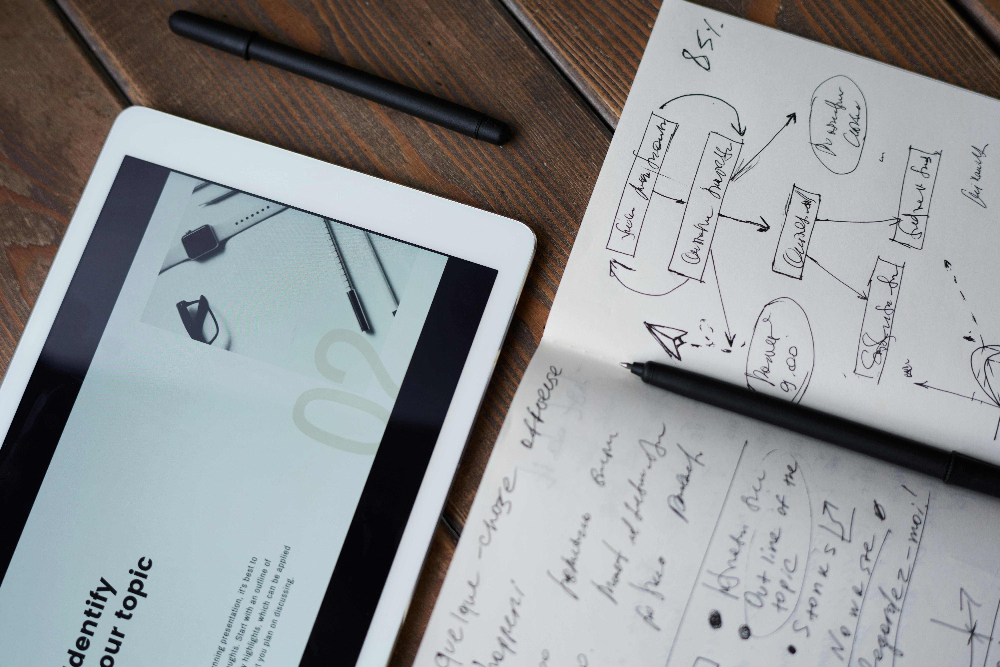

In [27]:
url = "https://images.pexels.com/photos/3183170/pexels-photo-3183170.jpeg"
pil_image = Image.open(BytesIO(requests.get(url).content))
img = AGImage(pil_image)
img

## Image Loading and Processing

This cell demonstrates how to fetch an image from a web URL and convert it into AutoGen's specialized image format for use with multimodal AI models. The process involves downloading image data, processing it with PIL (Python Imaging Library), and wrapping it in AutoGen's image class.

The code performs several steps in sequence:

**Image Fetching:**
- Uses a Pexels stock photo URL as the image source
- Makes an HTTP GET request using the `requests` library to download the image data
- The `.content` attribute retrieves the raw binary data of the image

**Image Processing:**
- `BytesIO()` creates a binary stream from the downloaded image data
- `Image.open()` from PIL opens and decodes the image, creating a PIL Image object
- This step validates that the downloaded data is actually a valid image file

**AutoGen Integration:**
- `AGImage()` wraps the PIL Image object in AutoGen's specialized image class
- This conversion makes the image compatible with AutoGen's multimodal messaging system
- The resulting image object can be used in MultiModalMessage objects for agent processing

**Why This Process is Important:**
- Vision-capable language models require images in specific formats
- AutoGen's AGImage class handles the technical details of image formatting for AI models
- The PIL processing ensures the image is properly decoded and accessible
- This approach maintains image quality while providing the interface needed for AI analysis

The output shows the AGImage object, which contains the processed image ready for use with vision-capable agents. This image will be used in subsequent cells to demonstrate multimodal AI capabilities.

In [28]:
multi_modal_message = MultiModalMessage(content=["Describe the content of this image in detail", img], source="User")

## Creating Multimodal Message
Combines text instructions and visual content into a single message that can be processed by vision-capable AI models.
The MultiModalMessage class accepts a list containing both string content (the instruction) and image objects, creating a unified input format.
Source attribution to "User" maintains proper conversation context and enables the agent to understand the message origin for appropriate response generation.
This approach demonstrates AutoGen's capability to seamlessly blend textual and visual information in AI conversations, opening possibilities for rich interactive experiences.

```mermaid
graph TD
    A[Text Instruction: "Describe image"] --> B[MultiModalMessage]
    C[AGImage Object] --> B
    D[Source: User] --> B
    B --> E[Unified Multimodal Input]
    E --> F[Vision Model Processing]
```

In [29]:
model_client = OpenAIChatCompletionClient(model="gpt-4o-mini")

describer = AssistantAgent(
    name="description_agent",
    model_client=model_client,
    system_message="You are good at describing images",
)

response = await describer.on_messages([multi_modal_message], cancellation_token=CancellationToken())
reply = response.chat_message.content
display(Markdown(reply))

The image depicts a workspace setup on a wooden table. On the left side, there is an electronic device, likely a tablet, displaying a presentation slide with the text "Identify your topic" prominently featured, alongside the number "02." The slide also shows various design elements, suggesting a layout or visual theme.

Beside the tablet, there is an open notebook filled with handwritten notes and sketches. The notes include flowcharts and arrows connecting different ideas, with various terms written inside boxes, indicating a brainstorming process. Some of the text appears to be in a mix of languages, and there are also doodles of shapes, including an arrow and a dotted line. A black pen lies horizontally across the notebook, and there is an additional pen placed above it.

Overall, the scene captures a creative workspace focused on planning or organizing ideas, suggesting an environment conducive to brainstorming and project development.

## Basic Image Description Agent
Creates an agent specialized in analyzing and describing images using OpenAI's vision-capable GPT-4 mini model.
The agent receives multimodal messages containing both text and images, processes the visual content through the language model's vision capabilities.
System message configuration optimizes the agent for descriptive tasks, ensuring detailed and accurate analysis of visual content.
The response processing demonstrates how vision models can extract meaningful information from images and provide human-readable descriptions in natural language.

```mermaid
graph TD
    A[Multimodal Message] --> B[Description Agent]
    B --> C[GPT-4 Vision Processing]
    C --> D[Image Analysis]
    D --> E[Natural Language Description]
    E --> F[Markdown Display]
    G[System Message: "Good at describing images"] --> B
```

In [30]:

class ImageDescription(BaseModel):
    scene: str = Field(description="Briefly, the overall scene of the image")
    message: str = Field(description="The point that the image is trying to convey")
    style: str = Field(description="The artistic style of the image")
    orientation: Literal["portrait", "landscape", "square"] = Field(description="The orientation of the image")


## Structured Output Schema

This cell defines a sophisticated data model using Pydantic to structure image analysis output with specific, validated fields for consistent AI responses. Pydantic is a Python library that provides data validation and serialization using Python type annotations, making it ideal for ensuring AI outputs follow a predictable structure.

The `ImageDescription` class defines four specific fields that the AI model will use to analyze images:

**Field Definitions:**
- `scene`: A brief description of the overall scene in the image
- `message`: The main point or message that the image is trying to convey
- `style`: The artistic style or visual characteristics of the image
- `orientation`: The physical orientation, limited to three specific values: "portrait", "landscape", or "square"

**Field Descriptions and Validation:**
Each field uses Pydantic's `Field` function with a description parameter that serves multiple purposes:
- Provides documentation for developers about what each field should contain
- Guides the AI model on what type of analysis to provide for each field
- Enables automatic API documentation generation
- Ensures consistent interpretation across different model runs

**Type Safety Features:**
- The `Literal` type for orientation ensures only valid values are accepted
- Automatic validation prevents invalid data from being processed
- Type hints provide IDE support and catch errors during development
- Serialization capabilities make the data easy to save, transmit, or convert to JSON

**Benefits of Structured Output:**
- Transforms unstructured AI responses into reliable, typed data objects
- Enables programmatic processing of AI analysis results
- Ensures consistency across multiple image analysis operations
- Facilitates integration with databases, APIs, and other systems
- Provides automatic validation and error handling

This structured approach is particularly valuable in production applications where you need predictable, processable output from AI models rather than free-form text responses.

In [31]:
model_client = OpenAIChatCompletionClient(model="gpt-4o-mini")

describer = AssistantAgent(
    name="description_agent",
    model_client=model_client,
    system_message="You are good at describing images in detail",
    output_content_type=ImageDescription,
)

response = await describer.on_messages([multi_modal_message], cancellation_token=CancellationToken())
reply = response.chat_message.content
reply

ImageDescription(scene='A workspace featuring a digital tablet and a notebook on a wooden surface, suggesting an environment of planning or brainstorming.', message='The image conveys a sense of organization and creativity, showcasing tools and notes related to a specific project or topic.', style='Realistic, with a focus on everyday items and a natural, casual setting.', orientation='landscape')

## Structured Image Analysis Agent
<div style="background: linear-gradient(135deg, #2196F3 0%, #21CBF3 100%); padding: 20px; border-radius: 15px; color: white; box-shadow: 0 8px 25px rgba(33, 150, 243, 0.3);">

### 🎯 **Advanced Vision Agent with Structured Output**
Creates an enhanced agent that returns structured image descriptions using the defined Pydantic schema for consistent, validated output format.
The `output_content_type` parameter instructs the agent to format responses according to the ImageDescription model, ensuring standardized data structure.
This approach combines the power of large vision models with the reliability of structured data validation, creating robust AI systems.
The agent automatically handles the conversion from natural language analysis to typed data objects, bridging unstructured AI with structured programming.

</div>

```mermaid
graph TD
    A["🖼️ Multimodal Input"] --> B["🤖 Vision Agent"]
    B --> C["🧠 GPT-4 Vision Analysis"]
    C --> D["📋 Pydantic Schema Enforcement"]
    D --> E["✅ Validated Output"]
    
    F["🎨 Scene Analysis"] --> G["📊 Structured Data"]
    H["💭 Message Interpretation"] --> G
    I["🎭 Style Classification"] --> G
    J["📐 Orientation Detection"] --> G
    
    E --> F
    E --> H  
    E --> I
    E --> J
    
    style A fill:#ff9ff3,stroke:#f368e0,stroke-width:3px,color:#fff
    style B fill:#54a0ff,stroke:#2e86de,stroke-width:3px,color:#fff
    style C fill:#5f27cd,stroke:#4c1b9f,stroke-width:3px,color:#fff
    style D fill:#00d2d3,stroke:#00a8a9,stroke-width:3px,color:#fff
    style E fill:#7bed9f,stroke:#5fb3d3,stroke-width:3px,color:#000
    style G fill:#ffa726,stroke:#f57c00,stroke-width:2px,color:#fff
```


In [32]:
import textwrap
print(f"Scene:\n{textwrap.fill(reply.scene)}\n\n")
print(f"Message:\n{textwrap.fill(reply.message)}\n\n")
print(f"Style:\n{textwrap.fill(reply.style)}\n\n")
print(f"Orientation:\n{textwrap.fill(reply.orientation)}\n\n")

Scene:
A workspace featuring a digital tablet and a notebook on a wooden
surface, suggesting an environment of planning or brainstorming.


Message:
The image conveys a sense of organization and creativity, showcasing
tools and notes related to a specific project or topic.


Style:
Realistic, with a focus on everyday items and a natural, casual
setting.


Orientation:
landscape




## Formatted Output Display
<div style="background: linear-gradient(135deg, #667eea 0%, #764ba2 100%); padding: 20px; border-radius: 15px; color: white; box-shadow: 0 8px 25px rgba(102, 126, 234, 0.3);">

### 📊 **Professional Output Formatting**  
Formats and displays the structured image analysis results in a readable text format with proper text wrapping and professional presentation.
The textwrap module ensures consistent line lengths and proper formatting, making the output suitable for reports, documentation, or user interfaces.
Each field from the Pydantic model is extracted and displayed separately, providing clear organization and easy readability of the analysis results.
This formatting approach transforms raw structured data into polished, presentation-ready content suitable for professional applications and client deliverables.

</div>

```mermaid
graph LR
    A["📋 Pydantic Object"] --> B["🎨 Scene Extraction"]
    A --> C["💭 Message Extraction"] 
    A --> D["🎭 Style Extraction"]
    A --> E["📐 Orientation Extraction"]
    
    B --> F["📄 Text Wrapping"]
    C --> F
    D --> F  
    E --> F
    
    F --> G["✨ Formatted Display"]
    
    style A fill:#6c5ce7,stroke:#5f3dc4,stroke-width:3px,color:#fff
    style B fill:#fd79a8,stroke:#e84393,stroke-width:2px,color:#fff
    style C fill:#fdcb6e,stroke:#e17055,stroke-width:2px,color:#fff
    style D fill:#00b894,stroke:#00a085,stroke-width:2px,color:#fff
    style E fill:#0984e3,stroke:#0974d1,stroke-width:2px,color:#fff
    style F fill:#2d3436,stroke:#636e72,stroke-width:2px,color:#fff
    style G fill:#00cec9,stroke:#00b3b8,stroke-width:3px,color:#fff
```

**🎨 Display Features:**
- 📏 **Text Wrapping**: Automatic line length management
- 🎯 **Field Separation**: Clear organization of different analysis aspects
- 📱 **Responsive Layout**: Adapts to different display widths
- ✅ **Professional Format**: Clean, report-ready presentation

In [33]:
# AutoGen's wrapper:

from autogen_ext.tools.langchain import LangChainToolAdapter

# LangChain tools:

from langchain_community.utilities import GoogleSerperAPIWrapper
from langchain_community.agent_toolkits import FileManagementToolkit
from langchain.agents import Tool


prompt = """Your task is to find a one-way non-stop flight from JFK to LHR in september 2025.
First search online for promising deals.
Next, write all the deals to a file called flights.md with full details.
Finally, select the one you think is best and reply with a short summary.
Reply with the selected flight only, and only after you have written the details to the file."""


serper = GoogleSerperAPIWrapper()
langchain_serper =Tool(name="internet_search", func=serper.run, description="useful for when you need to search the internet")
autogen_serper = LangChainToolAdapter(langchain_serper)
autogen_tools = [autogen_serper]

langchain_file_management_tools = FileManagementToolkit(root_dir="sandbox").get_tools()
for tool in langchain_file_management_tools:
    autogen_tools.append(LangChainToolAdapter(tool))

for tool in autogen_tools:
    print(tool.name, tool.description)

model_client = OpenAIChatCompletionClient(model="gpt-4o-mini")
agent = AssistantAgent(name="searcher", model_client=model_client, tools=autogen_tools, reflect_on_tool_use=True)
message = TextMessage(content=prompt, source="user")
result = await agent.on_messages([message], cancellation_token=CancellationToken())
for message in result.inner_messages:
    print(message.content)
display(Markdown(result.chat_message.content))

internet_search useful for when you need to search the internet
copy_file Create a copy of a file in a specified location
file_delete Delete a file
file_search Recursively search for files in a subdirectory that match the regex pattern
move_file Move or rename a file from one location to another
read_file Read file from disk
write_file Write file to disk
list_directory List files and directories in a specified folder
[FunctionCall(id='call_JtH7i8KtYi5vPv0krgWcU2rU', arguments='{"query":"one-way non-stop flight from JFK to LHR September 2025 deals"}', name='internet_search')]
[FunctionExecutionResult(content='Need to get from New York to London? With fares from $509, we offer a great choice of food, drinks and onboard entertainment & WiFi. Cheap Flights from New York (JFK) to London (LHR) start at $177 for one-way and $373 for round trip. Earn your airline miles on top of our rewards! Find flights. Cheapest one-way flight, $129. Norse Atlantic UKNonstop7 hrOct 8. The cheapest one-way fl

I have gathered several flight options for one-way non-stop flights from JFK to LHR in September 2025. Now, I will write the details to a file called flights.md.

## Multi-Tool Flight Search Agent
<div style="background: linear-gradient(135deg, #FF6B6B 0%, #4ECDC4 100%); padding: 20px; border-radius: 15px; color: white; box-shadow: 0 8px 25px rgba(255, 107, 107, 0.3); margin: 10px 0;">

### ✈️ **Enterprise-Grade Tool Integration**
Integrates LangChain tools with AutoGen to create a sophisticated agent capable of internet search and comprehensive file management for flight deal research.
The agent combines Google Serper API for real-time web searches with a complete file management toolkit, enabling autonomous research and documentation workflows.
Tool reflection capabilities allow the agent to analyze and improve its tool usage, leading to more effective research strategies and better results.
This demonstrates AutoGen's enterprise-ready architecture for building complex, tool-enhanced agents that can handle multi-step business processes autonomously.

</div>

```mermaid
graph TB
    A["🎯 User Request: Find Flight"] --> B["🤖 Multi-Tool Agent"]
    B --> C["🌐 Internet Search Tool"]
    B --> D["📁 File Management Tools"]
    
    C --> E["📊 Flight Data Collection"]
    D --> F["💾 Data Storage & Organization"]
    
    E --> G["📋 flights.md Creation"]
    F --> G
    G --> H["📈 Analysis & Selection"]
    H --> I["✅ Final Recommendation"]
    
    J["🔄 Tool Reflection"] --> B
    
    subgraph "🛠️ Available Tools"
        K["🔍 Search"]
        L["📝 Write File"] 
        M["📖 Read File"]
        N["📂 List Directory"]
        O["🚚 Move File"]
        P["🗑️ Delete File"]
        Q["🔎 File Search"]
    end
    
    style A fill:#ff7675,stroke:#d63031,stroke-width:3px,color:#fff
    style B fill:#0984e3,stroke:#0174d9,stroke-width:4px,color:#fff
    style C fill:#00b894,stroke:#00a085,stroke-width:3px,color:#fff
    style D fill:#fdcb6e,stroke:#f39c12,stroke-width:3px,color:#fff
    style I fill:#6c5ce7,stroke:#5f3dc4,stroke-width:3px,color:#fff
    style J fill:#fd79a8,stroke:#e84393,stroke-width:2px,color:#fff
```

**🚀 Advanced Capabilities:**
- 🔍 **Real-time Search**: Google Serper API integration
- 📁 **File Operations**: Complete CRUD operations
- 🧠 **Self-Reflection**: Analyzes and improves tool usage
- 🔄 **Workflow Automation**: Multi-step autonomous processes

In [34]:
# Now we need to call the agent again to write the file

message = TextMessage(content="OK proceed", source="user")

result = await agent.on_messages([message], cancellation_token=CancellationToken())
for message in result.inner_messages:
    print(message.content)
display(Markdown(result.chat_message.content))

[FunctionCall(id='call_W8zIojcHhRP797LnAw230lRN', arguments='{"file_path":"flights.md","text":"### One-way Non-stop Flights from JFK to LHR - September 2025\\n\\n1. **Airline**: American Airlines  \\n   **Price**: $472.15  \\n   **Departure**: JFK  \\n   **Arrival**: LHR  \\n   **Duration**: Approx. 7 hours  \\n   **Date**: September 20, 2025  \\n   **Features**: Flexible options, checked baggage allowance, onboard entertainment.\\n\\n2. **Airline**: British Airways  \\n   **Price**: $509  \\n   **Departure**: JFK  \\n   **Arrival**: LHR  \\n   **Duration**: Approx. 7 hours  \\n   **Date**: September 25, 2025  \\n   **Features**: Award-winning service, food, drinks, Wi-Fi.\\n\\n3. **Airline**: JetBlue  \\n   **Price**: $198  \\n   **Departure**: JFK  \\n   **Arrival**: LHR  \\n   **Duration**: Approx. 7 hours  \\n   **Date**: September 30, 2025  \\n   **Features**: Affordable fare, good service, flexible booking options.\\n\\n### Summary\\n- The most affordable non-stop flight is with 

I have successfully written the details of the flights to the file "flights.md." 

The selected flight is:

**Airline**: American Airlines  
**Price**: $472.15  
**Departure**: JFK  
**Arrival**: LHR  
**Duration**: Approx. 7 hours  
**Date**: September 20, 2025  
**Features**: Flexible options, checked baggage allowance, onboard entertainment.

This flight offers a good balance of comfort and service for a reasonable price. 

TERMINATE

## Continuing Agent Task
Sends a follow-up message to the agent to complete the flight search task and write results to a file.

In [35]:
from autogen_agentchat.agents import AssistantAgent
from autogen_agentchat.conditions import  TextMentionTermination
from autogen_agentchat.teams import RoundRobinGroupChat

from autogen_ext.tools.langchain import LangChainToolAdapter
from langchain_community.utilities import GoogleSerperAPIWrapper
from langchain.agents import Tool

serper = GoogleSerperAPIWrapper()
langchain_serper =Tool(name="internet_search", func=serper.run, description="useful for when you need to search the internet")
autogen_serper = LangChainToolAdapter(langchain_serper)

model_client = OpenAIChatCompletionClient(model="gpt-4o-mini")


prompt = """Find a one-way non-stop flight from JFK to LHR in June 2025."""


primary_agent = AssistantAgent(
    "primary",
    model_client=model_client,
    tools=[autogen_serper],
    system_message="You are a helpful AI research assistant who looks for promising deals on flights. Incorporate any feedback you receive.",
)

evaluation_agent = AssistantAgent(
    "evaluator",
    model_client=model_client,
    system_message="Provide constructive feedback. Respond with 'APPROVE' when your feedback is addressed.",
)

text_termination = TextMentionTermination("APPROVE")

# With thanks to Peter A for adding in the max_turns - otherwise this can get into a loop..

team = RoundRobinGroupChat([primary_agent, evaluation_agent], termination_condition=text_termination, max_turns=20)


## Multi-Agent Team Setup
<div style="background: linear-gradient(135deg, #A8E6CF 0%, #3D5A80 100%); padding: 20px; border-radius: 15px; color: white; box-shadow: 0 8px 25px rgba(168, 230, 207, 0.4); margin: 10px 0;">

### 👥 **Collaborative AI Team Architecture**
Creates a sophisticated collaborative team with specialized agents using round-robin conversation patterns and intelligent approval-based termination.
The primary research agent focuses on finding flight deals and gathering comprehensive information, while the evaluation agent provides quality control and feedback.
Round-robin conversation ensures both agents contribute to the solution, with the evaluator providing constructive criticism and the researcher incorporating feedback.
The approval termination pattern ("APPROVE") creates a natural stopping condition when the evaluator is satisfied with the research quality and completeness.

</div>

```mermaid
graph TD
    A["🎯 Flight Search Task"] --> B["👥 Multi-Agent Team"]
    
    B --> C["🔍 Primary Research Agent"]
    B --> D["⚖️ Evaluation Agent"]
    
    C --> E["📊 Initial Research"]
    E --> F["📋 Results Presentation"]
    F --> D
    
    D --> G{Quality Check}
    G -->|"Needs Improvement"| H["💬 Constructive Feedback"]
    G -->|"Satisfactory"| I["✅ APPROVE Signal"]
    
    H --> C
    I --> J["🏁 Task Completion"]
    
    K["🔄 Round Robin Pattern"] --> C
    K --> D
    
    L["⏰ Max Turns Limit: 20"] --> B
    
    subgraph "🛡️ Safety Features"
        M["🚨 Loop Prevention"]
        N["⏱️ Timeout Protection"] 
        O["🎯 Clear Termination"]
    end
    
    style A fill:#ff9ff3,stroke:#f368e0,stroke-width:3px,color:#fff
    style B fill:#54a0ff,stroke:#2e86de,stroke-width:4px,color:#fff
    style C fill:#5f27cd,stroke:#4c2c9f,stroke-width:3px,color:#fff
    style D fill:#00d2d3,stroke:#00a8a9,stroke-width:3px,color:#fff
    style I fill:#7bed9f,stroke:#57c776,stroke-width:3px,color:#000
    style J fill:#ffa726,stroke:#f57c00,stroke-width:3px,color:#fff
```

**⚡ Team Benefits:**
- 🔄 **Quality Assurance**: Built-in review and feedback loops
- 🚀 **Specialized Roles**: Research and evaluation expertise
- 🛡️ **Loop Prevention**: Max turns and clear termination
- 📈 **Iterative Improvement**: Feedback-driven refinement

In [36]:
result = await team.run(task=prompt)
for message in result.messages:
    print(f"{message.source}:\n{message.content}\n\n")


user:
Find a one-way non-stop flight from JFK to LHR in June 2025.


primary:
[FunctionCall(id='call_0zmhxvMcSQg1lt420oMqXABD', arguments='{"query":"one-way non-stop flight from JFK to LHR June 2025"}', name='internet_search')]


primary:
[FunctionExecutionResult(content='Cheap Flights from New York (JFK) to London (LHR) start at $177 for one-way and $373 for round trip. Earn your airline miles on top of our rewards! Virgin Atlantic offers 42 nonstop flights per week. Virgin Atlantic flies from John F. Kennedy International Airport (JFK) to Heathrow Airport (LHR). Need to get from New York to London? With fares from $509, we offer a great choice of food, drinks and onboard entertainment & WiFi. Kennedy International Airport (JFK) to Heathrow Airport (LHR), American Airlines offers flexible options that you can search according to schedule, budget, fare ... $198 per passenger.Departing Wed, Oct 1.One-way flight with jetBlue.Outbound direct flight with jetBlue departing from New York Joh

## Running Multi-Agent Team
Executes the collaborative flight search task with the two-agent team, showing the conversation flow between research and evaluation agents.

In [37]:
from autogen_agentchat.agents import AssistantAgent
from autogen_ext.models.openai import OpenAIChatCompletionClient
from autogen_ext.tools.mcp import StdioServerParams, mcp_server_tools

# Get the fetch tool from mcp-server-fetch.
fetch_mcp_server = StdioServerParams(command="uvx", args=["mcp-server-fetch"], read_timeout_seconds=30)
fetcher = await mcp_server_tools(fetch_mcp_server)

# Create an agent that can use the fetch tool.
model_client = OpenAIChatCompletionClient(model="gpt-4o-mini")
agent = AssistantAgent(name="fetcher", model_client=model_client, tools=fetcher, reflect_on_tool_use=True)  # type: ignore

# Let the agent fetch the content of a URL and summarize it.
result = await agent.run(task="Review jellyfishtechnologies.com and summarize what you learn. Reply in Markdown.")
display(Markdown(result.messages[-1].content))

# Summary of Jellyfish Technologies

## Overview
Jellyfish Technologies is a digital product and software development company with over 14 years of experience in the industry. They pride themselves on delivering custom software solutions and digital products specifically designed for small and medium enterprises (SMEs), startups, and larger organizations.

## Services Offered

### 1. Software Development & Consulting
- **Custom Software Solutions**: Focus on innovative software development using AI, Big Data, and Machine Learning technologies.

### 2. Data & Analytics Services
- **Data-Driven Solutions**: Provide analytics services to help businesses integrate and analyze data, leveraging AI for informed decision-making.

### 3. Application Modernization
- **Legacy Application Upgrades**: Modernizing existing software to enhance design, functionality, and technology stack.

### 4. AI Development
- **Custom AI Solutions**: Utilizing machine learning models and natural language processing to deliver intelligent and client-oriented products.

### 5. Cloud Engineering Services
- **Cloud Optimization**: Re-platforming and re-engineering applications for enhanced performance in cloud environments.

### 6. DevOps Services
- **Workflow Optimization**: Implementing automation and collaboration practices for efficient software delivery.

## Achievements
- Successfully completed over 4000 web, app, and software projects.
- High client retention rate indicating strong satisfaction and trust.
- Multiple industry awards and recognitions for their innovative work.

## Client Engagement
They serve a diverse range of industries and have a collaborative approach, ensuring projects are delivered on time while maintaining high-quality standards.

For more details, you can explore their services and case studies on their [website](https://jellyfishtechnologies.com).

---

TERMINATE

## MCP Server Integration  
<div style="background: linear-gradient(135deg, #667eea 0%, #764ba2 100%); padding: 20px; border-radius: 15px; color: white; box-shadow: 0 8px 25px rgba(102, 126, 234, 0.3); margin: 10px 0;">

### 🔌 **Model Context Protocol (MCP) Integration**
Demonstrates cutting-edge integration with Model Context Protocol servers to extend AutoGen agents with specialized web fetching capabilities.
MCP provides a standardized way to connect AI agents with external tools and services, creating a plugin-like architecture for enhanced functionality.
The `mcp-server-fetch` tool enables agents to access web content directly, analyze websites, and incorporate real-time information into their responses.
This represents the future of AI agent extensibility, allowing seamless integration with various external services and data sources through standardized protocols.

</div>

```mermaid
graph TB
    A["🌐 Web URL Request"] --> B["🔌 MCP Server Interface"]
    B --> C["⚡ mcp-server-fetch"]
    C --> D["📄 Content Retrieval"]
    D --> E["🤖 AutoGen Agent"]
    E --> F["🧠 Content Analysis"]
    F --> G["📝 Markdown Summary"]
    
    H["🔗 Protocol Benefits"] --> I["📋 Standardization"]
    H --> J["🔧 Extensibility"] 
    H --> K["🚀 Performance"]
    H --> L["🛡️ Security"]
    
    subgraph "🎯 Use Cases"
        M["📰 Website Analysis"]
        N["🔍 Research Tasks"]
        O["📊 Data Extraction"]
        P["✅ Content Validation"]
    end
    
    style A fill:#ff6b6b,stroke:#ee5a52,stroke-width:3px,color:#fff
    style B fill:#4ecdc4,stroke:#45b7aa,stroke-width:3px,color:#fff  
    style C fill:#45b7d1,stroke:#3a9bc1,stroke-width:3px,color:#fff
    style E fill:#96ceb4,stroke:#85c1a3,stroke-width:3px,color:#fff
    style G fill:#ffeaa7,stroke:#fdcb6e,stroke-width:3px,color:#000
```

**🌟 MCP Advantages:**
- 🔗 **Universal Protocol**: Standard interface for all external tools
- 🚀 **Real-time Data**: Live web content and API access  
- 🔒 **Secure Architecture**: Controlled access patterns
- 📈 **Scalable Design**: Easy addition of new capabilities